In [1]:
# !python -m pip install pyyaml==5.1

# # Properly install detectron2.
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# # Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities
# #(e.g. compiled operators).
# #(Please do not install twice in both ways)
# #!git clone 'https://github.com/facebookresearch/detectron2'
# #dist = distutils.core.run_setup("./detectron2/setup.py")
# #!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
# #sys.path.insert(0, os.path.abspath('./detectron2'))

In [1]:
import detectron2

# Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common detectron2 utilities
#https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# import some common libraries
import numpy as np
import torch, os, json, cv2, random
import matplotlib.pyplot as plt


/home/aispark/Project/CV/.venv/lib/python3.12/site-packages/detectron2/model_zoo/model_zoo.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


**Balloon Dataset**

In [2]:
#https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip

balloonData_path = 'balloon'

In [3]:
# if your dataset is in COCO format, then write the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

In [4]:
#function to parse and prepare bolloon dataset into detectron2's standard format

from detectron2.structures import BoxMode

def get_balloon_dicts(balloonData_path):
    json_file = os.path.join(balloonData_path, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}

        filename = os.path.join(balloonData_path, v["filename"])
        height, width = cv2.imread(filename).shape[:2]

        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [5]:
#Register the balloon dataset to detectron2

from detectron2.data import DatasetCatalog

for d in ["train", "val"]:
    DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts(balloonData_path + d))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])

balloon_metadata = MetadataCatalog.get("balloon_train")

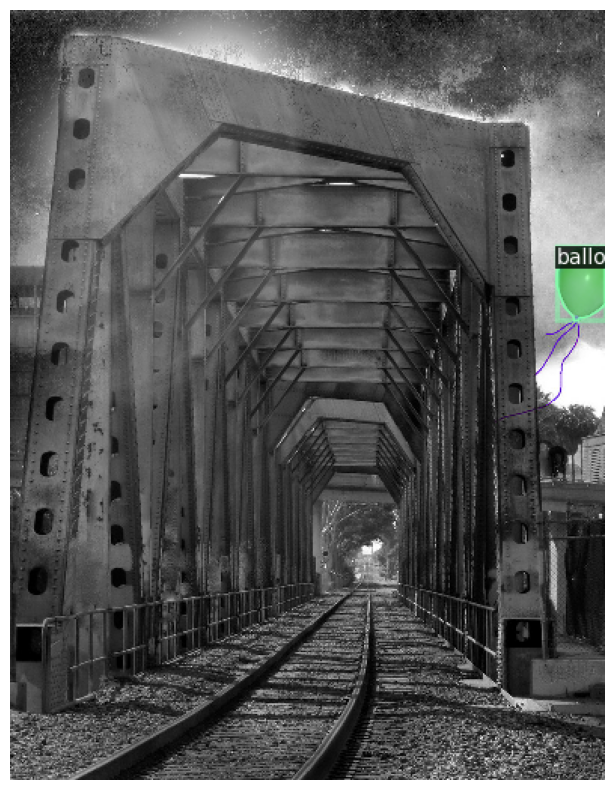

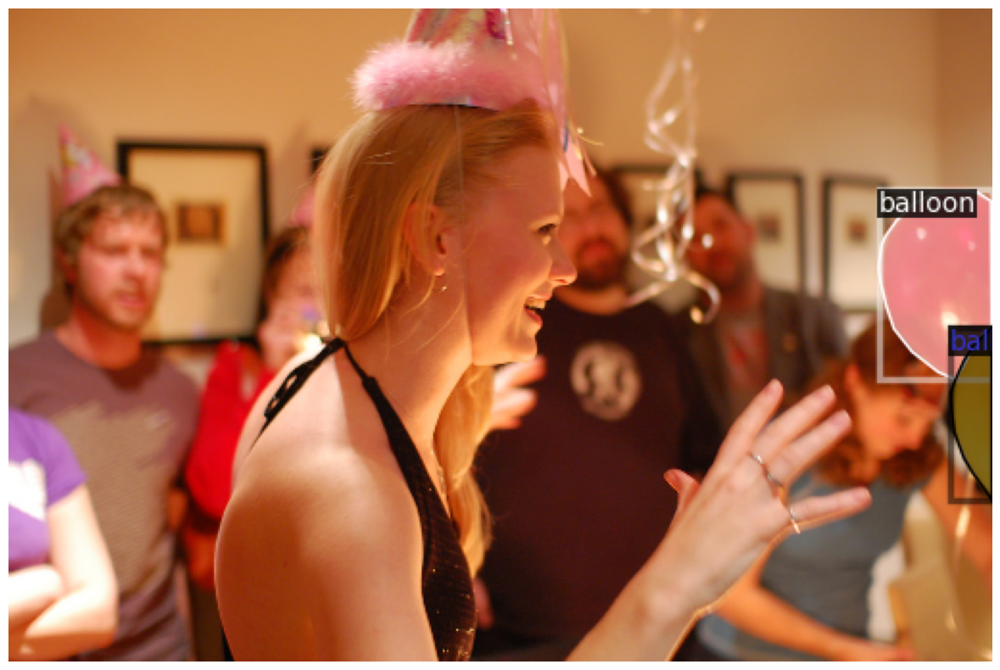

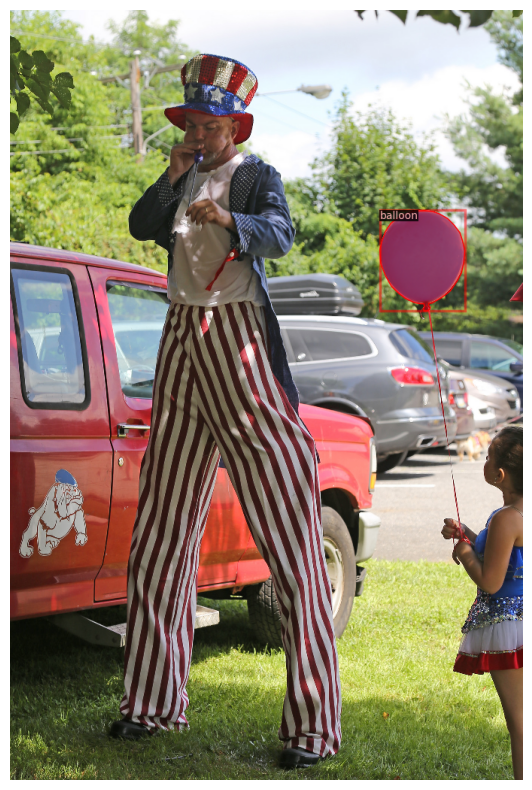

In [7]:
dataset_dicts = get_balloon_dicts(os.path.join(balloonData_path, "train"))
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    visualizer = Visualizer(img_rgb[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(15, 10)) 
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.axis("off")

# Instance Segmentation and Object Detection with Custom Dataset using Mask R-CNN

In [9]:
# # https://github.com/facebookresearch/detectron2/tree/main/configs/COCO-InstanceSegmentation

# from detectron2.engine import DefaultTrainer
# from detectron2.config import get_cfg

# cfg = get_cfg()
# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
# cfg.DATASETS.TRAIN = ("balloon_train",)
# cfg.DATASETS.TEST = ()
# cfg.DATALOADER.NUM_WORKERS = 2
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # initialize from model zoo
# cfg.SOLVER.IMS_PER_BATCH = 2
# cfg.SOLVER.BASE_LR = 0.00025
# cfg.SOLVER.MAX_ITER = 500
# cfg.SOLVER.STEPS = []        # do not decay learning rate
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
# cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

# os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
# trainer = DefaultTrainer(cfg)
# trainer.resume_or_load(resume=False)
# trainer.train()


from detectron2.data import DatasetCatalog, MetadataCatalog
import os
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
# 1. Wipe the old, broken registrations
DatasetCatalog.clear()
MetadataCatalog.clear()

# 2. Re-register with the correct path join logic
for d in ["train", "val"]:
    # We use a default argument (p=...) to "freeze" the correct path into the function
    target_path = os.path.join(balloonData_path, d)
    DatasetCatalog.register("balloon_" + d, lambda p=target_path: get_balloon_dicts(p))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])

print("Dataset re-registered. Starting trainer...")

# 3. Now run your training code
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 10
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.STEPS = [] 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


Dataset re-registered. Starting trainer...
[01/15 04:35:42 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=

/home/aispark/Project/CV/.venv/lib/python3.12/site-packages/torch/cuda/__init__.py:283: UserWarning: 
    Found GPU0 NVIDIA GB10 which is of cuda capability 12.1.
    Minimum and Maximum cuda capability supported by this version of PyTorch is
    (8.0) - (12.0)
    
  warnings.warn(


[01/15 04:35:42 d2.data.build]: Removed 0 images with no usable annotations. 61 images left.
[01/15 04:35:42 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 255          |
|            |              |
[01/15 04:35:42 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[01/15 04:35:42 d2.data.build]: Using training sampler TrainingSampler
[01/15 04:35:42 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/15 04:35:42 d2.data.common]: Serializing 61 elements to byte tensors and concatenating them all ...
[01/15 04:35:42 d2.data.common]: Serialized dataset takes 0.17 MiB
[01/15 04:35:42 d2.data.build]: Making batched data loader with batch_size=2
[01/15 04:35:43 d2.checkpoint.detection_checkpoint]: [De

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[01/15 04:35:43 d2.engine.train_loop]: Starting training from iteration 0


/home/aispark/Project/CV/.venv/lib/python3.12/site-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4317.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
W0115 04:35:43.904000 658678 torch/fx/_symbolic_trace.py:52] is_fx_tracing will return true for both fx.symbolic_trace and torch.export. Please use is_fx_tracing_symbolic_tracing() for specifically fx.symbolic_trace or torch.compiler.is_compiling() for specifically torch.export/compile.


[01/15 04:35:48 d2.utils.events]:  eta: 0:01:55  iter: 19  total_loss: 2.069  loss_cls: 0.6309  loss_box_reg: 0.6214  loss_mask: 0.6848  loss_rpn_cls: 0.03888  loss_rpn_loc: 0.00875    time: 0.2446  last_time: 0.3126  data_time: 0.0131  last_data_time: 0.0080   lr: 9.7405e-06  max_mem: 2459M
[01/15 04:35:53 d2.utils.events]:  eta: 0:01:48  iter: 39  total_loss: 1.828  loss_cls: 0.5577  loss_box_reg: 0.5754  loss_mask: 0.6313  loss_rpn_cls: 0.04903  loss_rpn_loc: 0.0083    time: 0.2405  last_time: 0.1946  data_time: 0.0062  last_data_time: 0.0064   lr: 1.9731e-05  max_mem: 2580M
[01/15 04:35:58 d2.utils.events]:  eta: 0:01:45  iter: 59  total_loss: 1.761  loss_cls: 0.4832  loss_box_reg: 0.6969  loss_mask: 0.5442  loss_rpn_cls: 0.02351  loss_rpn_loc: 0.008595    time: 0.2437  last_time: 0.2333  data_time: 0.0063  last_data_time: 0.0071   lr: 2.972e-05  max_mem: 2580M
[01/15 04:36:04 d2.utils.events]:  eta: 0:01:41  iter: 79  total_loss: 1.532  loss_cls: 0.4047  loss_box_reg: 0.6867  loss

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

# Inference & evaluation using the trained model

In [10]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("balloon_val", )
predictor = DefaultPredictor(cfg)

[01/15 04:43:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


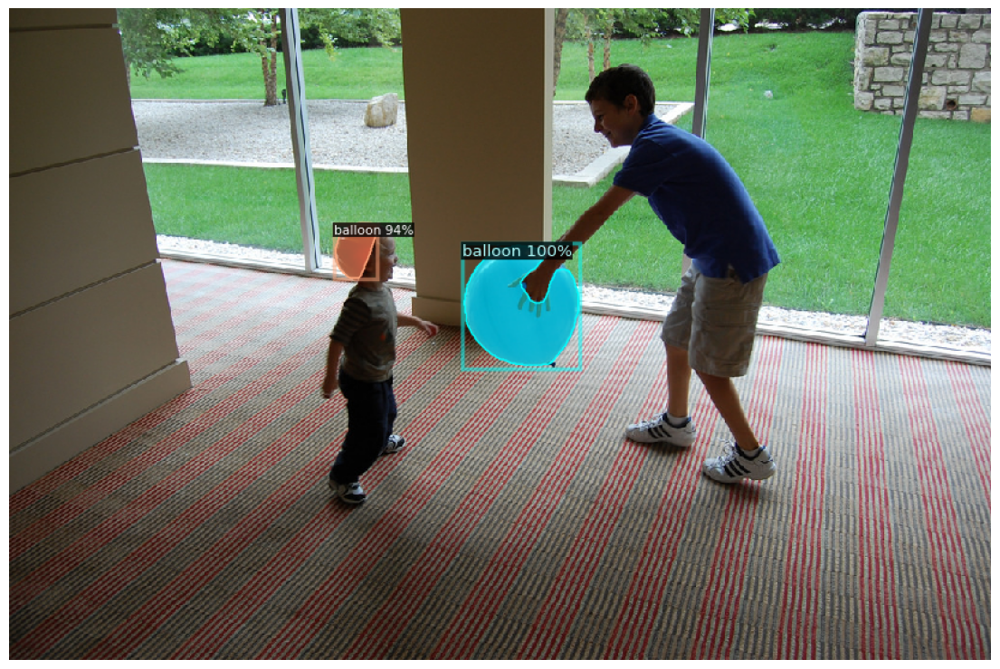

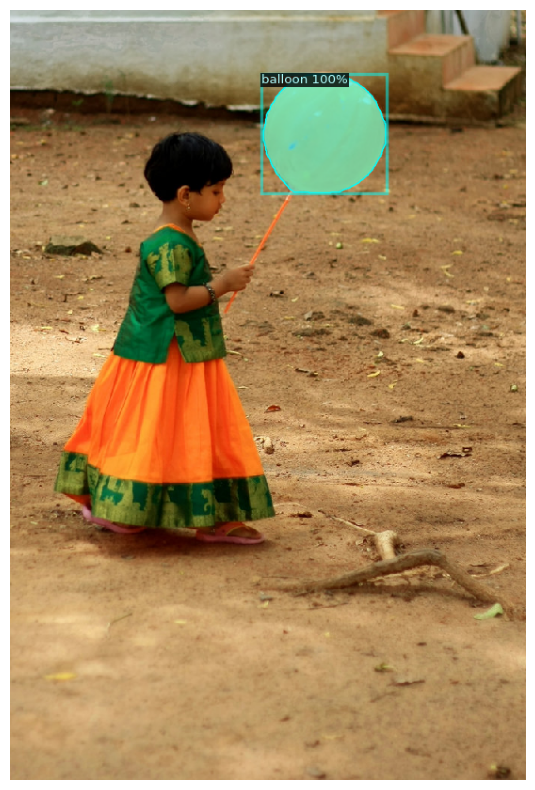

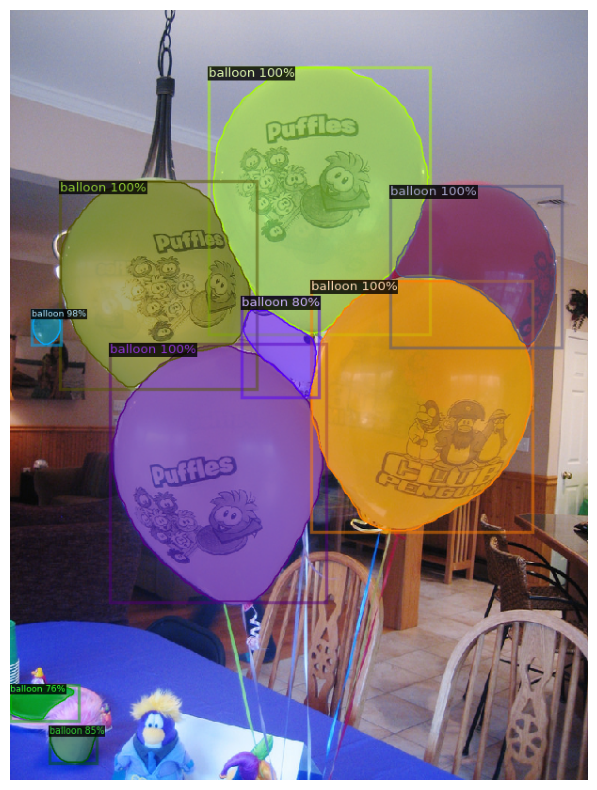

In [16]:
import os

# FIX: Use os.path.join to get 'balloon/val' instead of 'balloonval'
dataset_dicts = get_balloon_dicts(os.path.join(balloonData_path, "val"))

for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    
    # Visualizer expects RGB, so we flip the BGR image from cv2
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    
    plt.figure(figsize = (14, 10))
    # v.get_image() is already RGB, so just plot it directly!
    plt.imshow(v.get_image())
    plt.axis("off")
    plt.show()

 **Performance Metric**

 Evaluate the performance of Trained Mask RCNN using Intersection over Union (IOU) and Average Precision (AP) metrics implemented in COCO API.

In [14]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("balloon_val", ("bbox",), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "balloon_val")

print(inference_on_dataset(trainer.model, val_loader, evaluator))

[01/15 04:43:57 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/15 04:43:57 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/15 04:43:57 d2.data.common]: Serializing 13 elements to byte tensors and concatenating them all ...
[01/15 04:43:57 d2.data.common]: Serialized dataset takes 0.04 MiB
[01/15 04:43:57 d2.evaluation.evaluator]: Start inference on 13 batches
[01/15 04:43:58 d2.evaluation.evaluator]: Inference done 11/13. Dataloading: 0.0004 s/iter. Inference: 0.0631 s/iter. Eval: 0.0125 s/iter. Total: 0.0761 s/iter. ETA=0:00:00
[01/15 04:43:59 d2.evaluation.evaluator]: Total inference time: 0:00:00.676256 (0.084532 s / iter per device, on 1 devices)
[01/15 04:43:59 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.060927 s / iter per device, on 1 devices)
[01/15 04:43:59 d2.evaluation.coc